In [1]:
import numpy as np
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
from scipy.linalg import solve_banded
from scipy import sparse
import seaborn as sns
import pandas as pd
import os
os.environ["DDE_BACKEND"] = "pytorch" # Export Enviromental variable to use PyTorch
import deepxde as dde
from deepxde.backend import torch

Using backend: pytorch
Other supported backends: tensorflow.compat.v1, tensorflow, jax, paddle.
paddle supports more examples now and is recommended.


In [2]:
def pde(x, y):
    """
    PDE residual definition
    x[:, 0:1] - x-variable
    x[:, 1:2] - t-variable
    """
    dy_t = dde.grad.jacobian(y, x, i=0, j=1)
    dy_xx = dde.grad.hessian(y, x, i=0, j=0)
    dy_xxxx = dde.grad.hessian(dy_xx, x)
    return (
        dy_t
        + 0.0001*dy_xxxx
    )

def dy(x, y):
    dy_x = dde.grad.jacobian(y, x, j=0)
    return dy_x

def ddy(x, y):
    return dde.grad.hessian(y, x, i=0, j=0)

def dddy(x, y):
    dy_xx = dde.grad.jacobian(y, x, j=0)
    dy_xxx = dde.grad.hessian(dy_xx, x, j=0)
    return dy_xxx

def boundary_l(x, on_boundary):
    return on_boundary and dde.utils.isclose(x[0], 0)

def boundary_r(x, on_boundary):
    return on_boundary and dde.utils.isclose(x[0], 1)

def load_data(dataset_path):
    """
    Reads parquet files and formats data.
    """
    data = pd.read_parquet(dataset_path)
    y_data = data.pop('y').to_numpy().reshape(-1, 1)
    x_data = data.to_numpy()
    return x_data, y_data

def output_transform(x, y):
    return x[:, 0:1]*x[:, 1:2]*y

def feature_transform_sfourier(x):
    x1 = x[:, 0:1]
    t = x[:, 1:2]
    features = torch.cat([x1, t,
                         torch.sin(np.pi*t), torch.cos(np.pi*t),
                         torch.sin(2*np.pi*t), torch.cos(2*np.pi*t),
                         torch.sin(3*np.pi*t), torch.cos(3*np.pi*t),
                         torch.sin(4*np.pi*t), torch.cos(4*np.pi*t),
                         torch.sin(5*np.pi*t), torch.cos(5*np.pi*t),], dim=1)
    return features

B = torch.normal(mean=0, std=1, size=(128, 1), device='cpu')*1
def feature_transform_random(x):
    x1 = x[:, 0:1].reshape(-1, 1)
    t = x[:, 1:2].reshape(-1, 1)
    s = torch.sin((t @ B.T))
    c = torch.cos((t @ B.T))
    features = torch.cat([s, c, x1, t], dim=1)
    return features

geom = dde.geometry.Interval(0, 1) # X 
timedomain = dde.geometry.TimeDomain(0, 10) # T
geomtime = dde.geometry.GeometryXTime(geom, timedomain) # X x T

bc1 = dde.icbc.DirichletBC(geomtime, lambda x: 0, boundary_l)
bc2 = dde.icbc.OperatorBC(geomtime, lambda x, y, _: dy(x, y) - torch.cos(x[:, 1:2]), boundary_l)
bc3 = dde.icbc.OperatorBC(geomtime, lambda x, y, _: ddy(x, y), boundary_r)
bc4 = dde.icbc.OperatorBC(geomtime, lambda x, y, _: dddy(x, y), boundary_r)

ic = dde.icbc.IC(
    geomtime,
    lambda x: 0,
    lambda _, on_initial: on_initial,
)

data = dde.data.TimePDE(
    geomtime,
    pde,
    [bc1, bc2, bc3, bc4, ic],
    num_domain=6000,
    num_boundary=2000,
    num_initial=2000,
    num_test=10000,
)

net_soft = dde.nn.FNN([2] + [20] * 4 + [1], "tanh", "Glorot uniform")
# net.apply_output_transform(output_transform)
model_soft = dde.Model(data, net_soft)
model_soft.compile('L-BFGS')

data = dde.data.TimePDE(
    geomtime,
    pde,
    [bc2, bc3, bc4],
    num_domain=6000,
    num_boundary=2000,
    num_initial=2000,
    num_test=10000,
)
net_hard = dde.nn.FNN([2] + [20] * 4 + [1], "tanh", "Glorot uniform")
net_hard.apply_output_transform(output_transform)
model_hard = dde.Model(data, net_hard)
model_hard.compile('L-BFGS')

net_sf = dde.nn.FNN([12] + [20] * 4 + [1], "tanh", "Glorot uniform")
net_sf.apply_feature_transform(feature_transform_sfourier)
net_sf.apply_output_transform(output_transform)
model_sf = dde.Model(data, net_sf)
model_sf.compile('L-BFGS')

B = torch.tensor(np.load('./single_hardbcs_random_fourier/B_matrix.npy'))
net_rf = dde.nn.FNN([258] + [20] * 4 + [1], "tanh", "Glorot uniform")
net_rf.apply_feature_transform(feature_transform_random)
net_rf.apply_output_transform(output_transform)
model_rf = dde.Model(data, net_rf)
model_rf.compile('L-BFGS')

Compiling model...
'compile' took 0.000087 s

Compiling model...
'compile' took 0.000051 s

Compiling model...
'compile' took 0.000047 s

Compiling model...
'compile' took 0.000055 s



In [3]:
model_soft.restore(save_path = f"./fixed_softbcs_0.01/model-{45000}.pt")
ts = 1000
xs = 200

t_all = np.linspace(0, 10, ts)
x_all = np.linspace(0, 1, xs)
T, X = np.meshgrid(t_all, x_all, indexing='ij')
T_flat = T.ravel()
X_flat = X.ravel()

inputs = np.stack([X_flat, T_flat], axis=-1)
sol_flat = model_soft.predict(inputs)
sol_soft = sol_flat.reshape(ts, xs)

model_hard.restore(save_path = f"./fixed_hardbcs_0.01/model-{45000}.pt")
sol_flat = model_hard.predict(inputs)
sol_hard = sol_flat.reshape(ts, xs)

model_sf.restore(save_path = f"./fixed_hardbcs_sf_0.01/model-{45000}.pt")
sol_flat = model_sf.predict(inputs)
sol_sf = sol_flat.reshape(ts, xs)

model_rf.restore(save_path = f"./fixed_hardbcs_rf_0.01/model-{45000}.pt")
sol_flat = model_rf.predict(inputs)
sol_rf = sol_flat.reshape(ts, xs)

_, sol_flat = load_data(fr'./data/eta_long_{0.01}.parquet')
sol_fdm = sol_flat.reshape(ts, xs)

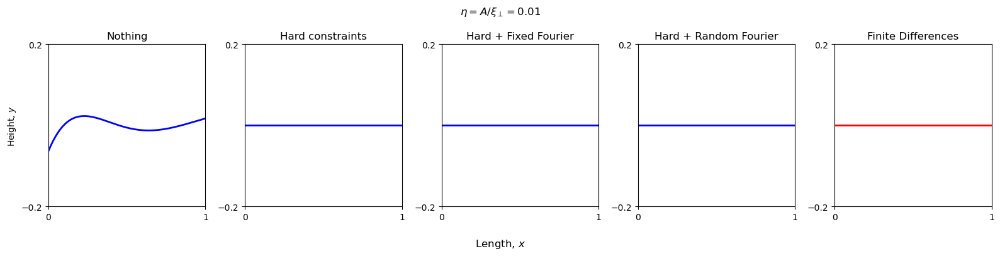

In [4]:
fig = plt.figure(figsize=(16, 4))
ax1 = fig.add_subplot(151)
ax2 = fig.add_subplot(152)
ax3 = fig.add_subplot(153)
ax4 = fig.add_subplot(154)
ax5 = fig.add_subplot(155)
ax1.set_xlim(0, 1)
ax1.set_ylim(-0.2, 0.2)
ax1.set_xticks([0, 1])
ax1.set_yticks([-0.2, 0.2])
ax1.set_title('Nothing')
line1, = ax1.plot(x_all, sol_soft[0], color='blue', lw=2)
ax2.set_xlim(0, 1)
ax2.set_ylim(-0.2, 0.2)
ax2.set_xticks([0, 1])
ax2.set_yticks([-0.2, 0.2])
ax2.set_title('Hard constraints')
line2, = ax2.plot(x_all, sol_hard[0], color='blue', lw=2)
ax3.set_xlim(0, 1)
ax3.set_ylim(-0.2, 0.2)
ax3.set_xticks([0, 1])
ax3.set_yticks([-0.2, 0.2])
ax3.set_title('Hard + Fixed Fourier')
line3, = ax3.plot(x_all, sol_sf[0], color='blue', lw=2)
ax4.set_xlim(0, 1)
ax4.set_ylim(-0.2, 0.2)
ax4.set_xticks([0, 1])
ax4.set_yticks([-0.2, 0.2])
ax4.set_title('Hard + Random Fourier')
line4, = ax4.plot(x_all, sol_rf[0], color='blue', lw=2)
ax5.set_xlim(0, 1)
ax5.set_ylim(-0.2, 0.2)
ax5.set_xticks([0, 1])
ax5.set_yticks([-0.2, 0.2])
ax5.set_title('Finite Differences')
line5, = ax5.plot(x_all, sol_fdm[0], color='red', lw=2)
fig.suptitle(r'$\eta = A/\xi_\perp = 0.01$')
fig.supxlabel(r'Length, $x$')
ax1.set_ylabel(r'Height, $y$')
fig.tight_layout()
def update(fn):
    line1.set_data(x_all, sol_soft[10*fn])
    line2.set_data(x_all, sol_hard[10*fn])
    line3.set_data(x_all, sol_sf[10*fn])
    line4.set_data(x_all, sol_rf[10*fn])
    line5.set_data(x_all, sol_fdm[10*fn])
animation = FuncAnimation(fig, update, interval=50, frames=100)
animation.save('./videos/fixed.gif')
HTML(animation.to_jshtml())

In [5]:
geom = dde.geometry.Rectangle([0, 0.0001], [1, 10]) # X x [\eta]
timedomain = dde.geometry.TimeDomain(0, 10) # T
geomtime = dde.geometry.GeometryXTime(geom, timedomain) # X x [\eta] x T

def pde(x, y):
    """
    PDE residual definition
    x[:, 0:1] - x-variable
    x[:, 1:2] - eta
    x[:, 2:3] - t-variable
    """
    dy_t = dde.grad.jacobian(y, x, i=0, j=2)
    dy_xx = dde.grad.hessian(y, x, i=0, j=0)
    dy_xxxx = dde.grad.hessian(dy_xx, x)
    return (
        dy_t
        + x[:, 1:2]*dy_xxxx
    )

def dy(x, y):
    dy_x = dde.grad.jacobian(y, x, j=0)
    return dy_x

def ddy(x, y):
    return dde.grad.hessian(y, x, i=0, j=0)

def dddy(x, y):
    dy_xx = dde.grad.jacobian(y, x, j=0)
    dy_xxx = dde.grad.hessian(dy_xx, x, j=0)
    return dy_xxx

def boundary_l(x, on_boundary):
    return on_boundary and dde.utils.isclose(x[0], 0)

def boundary_r(x, on_boundary):
    return on_boundary and dde.utils.isclose(x[0], 1)

def output_transform(x, y):
    return x[:, 0:1]*x[:, 2:3]*y

bc1 = dde.icbc.DirichletBC(geomtime, lambda x: 0, boundary_l)
bc2 = dde.icbc.OperatorBC(geomtime, lambda x, y, _: dy(x, y) - torch.cos(x[:, 2:3]), boundary_l)
bc3 = dde.icbc.OperatorBC(geomtime, lambda x, y, _: ddy(x, y), boundary_r)
bc4 = dde.icbc.OperatorBC(geomtime, lambda x, y, _: dddy(x, y), boundary_r)

ic = dde.icbc.IC(
    geomtime,
    lambda x: 0,
    lambda _, on_initial: on_initial,
)

data = dde.data.TimePDE(
    geomtime,
    pde,
    [bc1, bc2, bc3, bc4, ic],
    num_domain=6000,
    num_boundary=2000,
    num_initial=2000,
    num_test=6000,
)

In [6]:
net_psoft = dde.nn.FNN([3] + [20] * 4 + [1], "tanh", "Glorot uniform")
model_psoft = dde.Model(data, net_psoft)
model_psoft.compile('L-BFGS')

model_psoft.restore('./run_soft_0/model-45000.pt')
t_all = np.linspace(0, 10, ts)
x_all = np.linspace(0, 1, xs)
eta = 1
T, X = np.meshgrid(t_all, x_all, indexing='ij')
T_flat = T.ravel()
X_flat = X.ravel()
ETA_flat = np.full_like(T_flat, eta)
inputs = np.stack([X_flat, ETA_flat, T_flat], axis=-1)

sol_flat = model_psoft.predict(inputs)
sol = sol_flat.reshape(ts, xs)
data_soft = pd.DataFrame(sol, columns=x_all, index=t_all)

net_phard = dde.nn.FNN([3] + [20] * 4 + [1], "tanh", "Glorot uniform")
net_phard.apply_output_transform(output_transform)
model_phard = dde.Model(data, net_phard)
model_phard.compile('L-BFGS')

model_phard.restore('./run_hard_0/model-45000.pt')
t_all = np.linspace(0, 10, ts)
x_all = np.linspace(0, 1, xs)
eta = 1
T, X = np.meshgrid(t_all, x_all, indexing='ij')
T_flat = T.ravel()
X_flat = X.ravel()
ETA_flat = np.full_like(T_flat, eta)
inputs = np.stack([X_flat, ETA_flat, T_flat], axis=-1)

sol_flat = model_phard.predict(inputs)
sol = sol_flat.reshape(ts, xs)
data_hard = pd.DataFrame(sol, columns=x_all, index=t_all)

def feature_transform(x):
    x1 = x[:, 0:1]
    x = x[:, 1:3]
    features = torch.cat([x, x1,
                         torch.sin(np.pi*x), torch.cos(np.pi*x),
                         torch.sin(2*np.pi*x), torch.cos(2*np.pi*x),
                         torch.sin(3*np.pi*x), torch.cos(3*np.pi*x),
                         torch.sin(4*np.pi*x), torch.cos(4*np.pi*x),
                         torch.sin(5*np.pi*x), torch.cos(5*np.pi*x),], dim=1)
    return features

net_psf = dde.nn.FNN([23] + [20] * 4 + [1], "tanh", "Glorot uniform")
net_psf.apply_feature_transform(feature_transform)
net_psf.apply_output_transform(output_transform)
model_psf = dde.Model(data, net_psf)
model_psf.compile('L-BFGS')

B = torch.tensor(np.load('./run_rf_0/B_matrix.npy'))
def feature_transform_random(x):
    x1 = x[:, 0:1].reshape(-1, 1)
    eta = x[:, 1:2].reshape(-1, 1)
    t = x[:, 2:3].reshape(-1, 1)
    
    x = x[:, 1:3]
    s = torch.sin((x @ B.T))
    c = torch.cos((x @ B.T))
    features = torch.cat([s, c, x1, eta, t], dim=1)
    return features

net_prf = dde.nn.FNN([259] + [20] * 4 + [1], "tanh", "Glorot uniform")
net_prf.apply_feature_transform(feature_transform_random)
net_prf.apply_output_transform(output_transform)
model_prf = dde.Model(data, net_prf)
model_prf.compile('L-BFGS')

Compiling model...
'compile' took 0.000081 s

Compiling model...
'compile' took 0.000105 s

Compiling model...
'compile' took 0.000091 s

Compiling model...
'compile' took 0.000063 s



In [7]:
t_all = np.linspace(0, 10, ts)
x_all = np.linspace(0, 1, xs)
eta = 0.01
T, X = np.meshgrid(t_all, x_all, indexing='ij')
T_flat = T.ravel()
X_flat = X.ravel()
ETA_flat = np.full_like(T_flat, eta)
inputs = np.stack([X_flat, ETA_flat, T_flat], axis=-1)

model_phard.restore(save_path = f"./run_hard_log_0/model-45000.pt")
sol_flat = model_phard.predict(inputs)
sol_hard = sol_flat.reshape(ts, xs)

model_psoft.restore(save_path = f"./run_soft_0/model-45000.pt")
sol_flat = model_psoft.predict(inputs)
sol_soft = sol_flat.reshape(ts, xs)

model_psf.restore(save_path = f"./run_sf_0/model-45000.pt")
sol_flat = model_psf.predict(inputs)
sol_sf = sol_flat.reshape(ts, xs)

model_prf.restore(save_path = f"./run_rf_0/model-45000.pt")
sol_flat = model_prf.predict(inputs)
sol_rf = sol_flat.reshape(ts, xs)

_, sol_flat = load_data(fr'./data/eta_long_{0.01}.parquet')
sol_fdm = sol_flat.reshape(ts, xs)

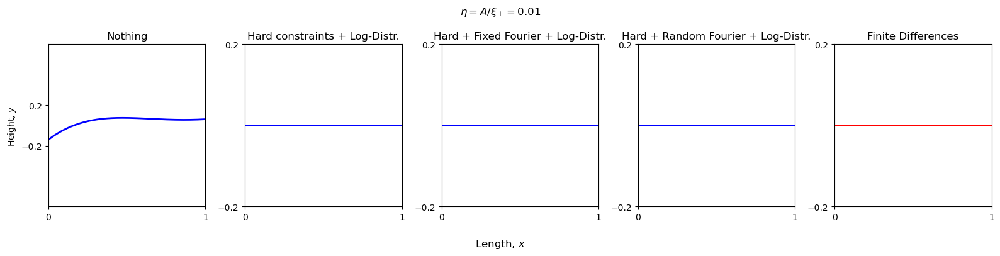

In [8]:
fig = plt.figure(figsize=(16, 4))
ax1 = fig.add_subplot(151)
ax2 = fig.add_subplot(152)
ax3 = fig.add_subplot(153)
ax4 = fig.add_subplot(154)
ax5 = fig.add_subplot(155)
ax1.set_xlim(0, 1)
ax1.set_ylim(-0.8, 0.8)
ax1.set_xticks([0, 1])
ax1.set_yticks([-0.2, 0.2])
ax1.set_title('Nothing')
line1, = ax1.plot(x_all, sol_soft[0], color='blue', lw=2)
ax2.set_xlim(0, 1)
ax2.set_ylim(-0.2, 0.2)
ax2.set_xticks([0, 1])
ax2.set_yticks([-0.2, 0.2])
ax2.set_title('Hard constraints + Log-Distr.')
line2, = ax2.plot(x_all, sol_hard[0], color='blue', lw=2)
ax3.set_xlim(0, 1)
ax3.set_ylim(-0.2, 0.2)
ax3.set_xticks([0, 1])
ax3.set_yticks([-0.2, 0.2])
ax3.set_title('Hard + Fixed Fourier + Log-Distr.')
line3, = ax3.plot(x_all, sol_sf[0], color='blue', lw=2)
ax4.set_xlim(0, 1)
ax4.set_ylim(-0.2, 0.2)
ax4.set_xticks([0, 1])
ax4.set_yticks([-0.2, 0.2])
ax4.set_title('Hard + Random Fourier + Log-Distr.')
line4, = ax4.plot(x_all, sol_rf[0], color='blue', lw=2)
ax5.set_xlim(0, 1)
ax5.set_ylim(-0.2, 0.2)
ax5.set_xticks([0, 1])
ax5.set_yticks([-0.2, 0.2])
ax5.set_title('Finite Differences')
line5, = ax5.plot(x_all, sol_fdm[0], color='red', lw=2)
fig.suptitle(r'$\eta = A/\xi_\perp = 0.01$')
fig.supxlabel(r'Length, $x$')
ax1.set_ylabel(r'Height, $y$')
fig.tight_layout()
def update(fn):
    line1.set_data(x_all, sol_soft[10*fn])
    line2.set_data(x_all, sol_hard[10*fn])
    line3.set_data(x_all, sol_sf[10*fn])
    line4.set_data(x_all, sol_rf[10*fn])
    line5.set_data(x_all, sol_fdm[10*fn])
animation = FuncAnimation(fig, update, interval=50, frames=100)
animation.save('./videos/parametric_low.gif')
HTML(animation.to_jshtml())

In [9]:
t_all = np.linspace(0, 10, ts)
x_all = np.linspace(0, 1, xs)
eta = 1
T, X = np.meshgrid(t_all, x_all, indexing='ij')
T_flat = T.ravel()
X_flat = X.ravel()
ETA_flat = np.full_like(T_flat, eta)
inputs = np.stack([X_flat, ETA_flat, T_flat], axis=-1)

model_phard.restore(save_path = f"./run_hard_log_0/model-45000.pt")
sol_flat = model_phard.predict(inputs)
sol_hard = sol_flat.reshape(ts, xs)

model_psoft.restore(save_path = f"./run_soft_0/model-45000.pt")
sol_flat = model_psoft.predict(inputs)
sol_soft = sol_flat.reshape(ts, xs)

model_psf.restore(save_path = f"./run_sf_0/model-45000.pt")
sol_flat = model_psf.predict(inputs)
sol_sf = sol_flat.reshape(ts, xs)

model_prf.restore(save_path = f"./run_rf_0/model-45000.pt")
sol_flat = model_prf.predict(inputs)
sol_rf = sol_flat.reshape(ts, xs)

_, sol_flat = load_data(fr'./data/eta_long_{1}.parquet')
sol_fdm = sol_flat.reshape(ts, xs)

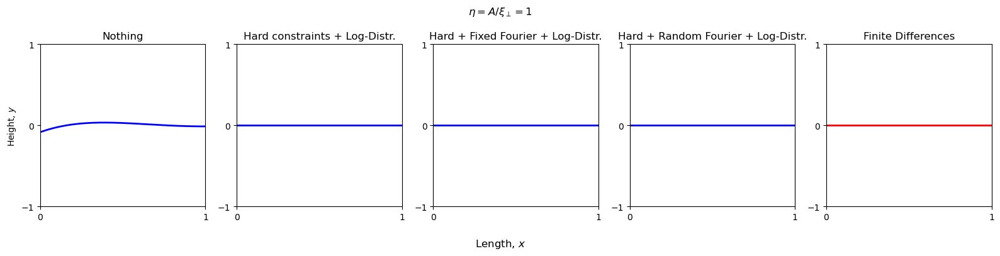

In [10]:
fig = plt.figure(figsize=(16, 4))
ax1 = fig.add_subplot(151)
ax2 = fig.add_subplot(152)
ax3 = fig.add_subplot(153)
ax4 = fig.add_subplot(154)
ax5 = fig.add_subplot(155)
ax1.set_xlim(0, 1)
ax1.set_ylim(-1, 1)
ax1.set_xticks([0, 1])
ax1.set_yticks([-1, 0, 1])
ax1.set_title('Nothing')
line1, = ax1.plot(x_all, sol_soft[0], color='blue', lw=2)
ax2.set_xlim(0, 1)
ax2.set_ylim(-1, 1)
ax2.set_xticks([0, 1])
ax2.set_yticks([-1, 0, 1])
ax2.set_title('Hard constraints + Log-Distr.')
line2, = ax2.plot(x_all, sol_hard[0], color='blue', lw=2)
ax3.set_xlim(0, 1)
ax3.set_ylim(-1, 1)
ax3.set_xticks([0, 1])
ax3.set_yticks([-1, 0, 1])
ax3.set_title('Hard + Fixed Fourier + Log-Distr.')
line3, = ax3.plot(x_all, sol_sf[0], color='blue', lw=2)
ax4.set_xlim(0, 1)
ax4.set_ylim(-1, 1)
ax4.set_xticks([0, 1])
ax4.set_yticks([-1, 0, 1])
ax4.set_title('Hard + Random Fourier + Log-Distr.')
line4, = ax4.plot(x_all, sol_rf[0], color='blue', lw=2)
ax5.set_xlim(0, 1)
ax5.set_ylim(-1, 1)
ax5.set_xticks([0, 1])
ax5.set_yticks([-1, 0, 1])
ax5.set_title('Finite Differences')
line5, = ax5.plot(x_all, sol_fdm[0], color='red', lw=2)
fig.suptitle(r'$\eta = A/\xi_\perp = 1$')
fig.supxlabel(r'Length, $x$')
ax1.set_ylabel(r'Height, $y$')
fig.tight_layout()
def update(fn):
    line1.set_data(x_all, sol_soft[10*fn])
    line2.set_data(x_all, sol_hard[10*fn])
    line3.set_data(x_all, sol_sf[10*fn])
    line4.set_data(x_all, sol_rf[10*fn])
    line5.set_data(x_all, sol_fdm[10*fn])
animation = FuncAnimation(fig, update, interval=50, frames=100)
animation.save('./videos/parametric_high.gif')
HTML(animation.to_jshtml())